In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats as ss
import plotly.graph_objects as go
import plotly.express as px
from matplotlib.pyplot import figure
import random
import seaborn as sns
np.random.seed(1234)
sns.set()
import plotly.figure_factory as ff
from scipy.optimize import curve_fit
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

In [2]:
# data = pd.read_table('./GasProductionData_RateTime.txt')
# data

In [3]:
# time = np.array(data['time'][1:])
# Rate=np.array(data['Rate'][1:])

In [4]:
# plt.plot(time,Rate,'o')

In [5]:
def ArpsRate(t,qi, Di, b):

#     if b[:]==0:

#         ArpsRate = exponentialRate(qi, Di, t)
#     else:

    ArpsRate = qi / (1 + b * Di * t) ** (1 / b)
    
 
    return ArpsRate
# '///////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////
# 'This function calculates the instantanous flow rate of an exponential decline curve
def exponentialRate(qi, Di, t):
    exponentialRate = qi * Exp(-Di * t) 
    return exponentialRate
###################
#SEM is being used for unconventinal field and here explain the turth for us.
def SEM(t,q0,Tau,n):
    qt = q0*np.exp(-(t/Tau)**n)
    return qt

In [6]:
def triangular_samples(minimum,mode,maximum,N_samples):
#     samples = np.zeros(int(N_samples))
    loc = minimum
    scale = maximum - minimum
    c = (mode - loc)/scale
    samples = ss.triang.rvs(c, loc, scale, N_samples)
    return samples

In [7]:
def uniform_samples(minimum, maximum, N_samples):
    samples = np.zeros(int(N_samples))
    loc = minimum
    scale = maximum - loc
    samples = ss.uniform.rvs(loc, scale, N_samples)
    return samples

In [8]:
def Normal_samples(mean_norm,sd_norm,N_samples):
    samples = np.zeros(int(N_samples))
    samples = ss.norm.rvs(mean_norm,sd_norm,N_samples)
    return samples

In [9]:
def lognormal_samples(mean_lognormal, sd_lognormal, N_samples):
#     samples = np.zeros(int(N_samples))
    mean_normal = np.log(mean_lognormal**2/np.sqrt(sd_lognormal**2+mean_lognormal**2))
    sd_normal = np.sqrt(np.log(1+sd_lognormal**2/mean_lognormal**2))
    samples = ss.lognorm.rvs(s=sd_normal, scale=np.exp(mean_normal), size=N_samples,)
    return samples

In [10]:
# Program to calculate moving average
def MA(arr, window_size):
    window_size = 3
    i = 0
    moving_averages = []
    while i < len(arr) - window_size + 1:
        window = arr[i : i + window_size]
        window_average = round(sum(window) / window_size, 2)
        moving_averages.append(window_average)
        i += 1

    return moving_averages

In [11]:
# define sample size
n_samples = 100

# sample q0
q0_mean = 1000
q0_sd = 180
q0_samples = lognormal_samples(q0_mean,q0_sd, n_samples)

# sample Tau
Tau_mean = 30
Tau_sd = 5
Tau_samples = Normal_samples(Tau_mean,Tau_sd,n_samples)

# sample n
n_min = .5
n_max = .9
n_samples = uniform_samples(n_min, n_max, n_samples)



In [12]:
times = np.array([range(50)]).T

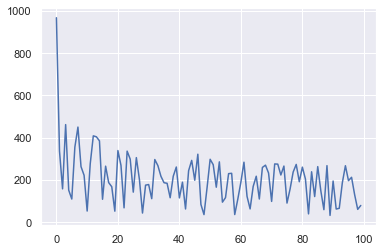

In [13]:
# Generate sythetic truth based on an unconvetional field
n = 0.2
Tau = 25
N = 100
T = np.arange(0,N)
Q1 = uniform_samples(102,1000,N)
Q_SEM = SEM(T,Q1,Tau,n)
plt.plot(T,Q_SEM)

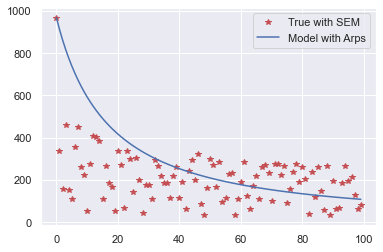

In [14]:
# b0= .0000004
# Di0 = 0.000004
pred_q = ArpsRate(t=T,qi=Q1[0],Di =.06,b =.8)
plt.plot(T,Q_SEM,'r*',label='True with SEM')
mismatch = np.subtract(pred_q,Q_SEM)
plt.plot(T,pred_q,label='Model with Arps')
plt.legend()

In [15]:
def p(arrY,lst, window_size=10):
    fig, ax = plt.subplots(figsize=(7,8))
    ss = pd.Series(arrY)
    ss.rolling(window_size).mean().plot(ax=ax,label='mean')
    ss.rolling(window_size).std().plot(ax=ax,label='STD')
    ss.rolling(window_size).quantile(.1, interpolation='linear').plot(ax=ax,label='P10')
    ss.rolling(window_size).quantile(.9, interpolation='linear').plot(ax=ax,label='P90')
    ss.rolling(window_size).quantile(.5, interpolation='linear').plot(ax=ax,label='P50')
    ax.legend()
    ax.set_ylabel("mismatch")
    ax.set_xlabel("model of Qt")
    sns.jointplot(data=lst)
def movingaverage(x,y, window_size=10):
    window = np.ones(int(window_size))/float(window_size)
    y_av = np.convolve(y, window, 'same')
    plt.figure(figsize=(7,8))
    plt.plot(x,y,"k.")
    plt.plot(x, y_av,"r")
    plt.xlim(0,1000)
    plt.xlabel("Model.")
    plt.ylabel("mismatich")
    plt.grid(True)
    plt.show()
# def plot_p():
def M(arrX,arrY, point,radious):
    df=np.vstack((arrX,arrY)).T
    lst=[]
    for i in range(len(arrX)):
        if (df[i,0]>= point-radious)& (df[i,0]<=point+radious):
            lst.append(df[i,1])
    if len(lst)==0:
        print( "Not in range")
        return 
    print(len(lst))        
    mu=np.mean(lst)
    sd=np.std(lst)
    PC=np.percentile(lst,[10,50,90])
    dic={'mean':[mu,'r'], 'STD': [sd,'b'], 'P10':[PC[0],'y'], 'P50':[PC[1],'g'], 'P90':[PC[2],'k']}
    #####
    movingaverage(arrX, arrY)
    p(arrY,lst)
    fig, axes = plt.subplots(2, 1, sharex=True, figsize=(15,10))
    sns.kdeplot(lst,ax=axes[0]).set_title("dist at point")
    for key, val in dic.items():
        axes[0].axvline(x=val[0],linewidth=4, color=val[1], label=key)
        axes[0].legend()
    return dic

6


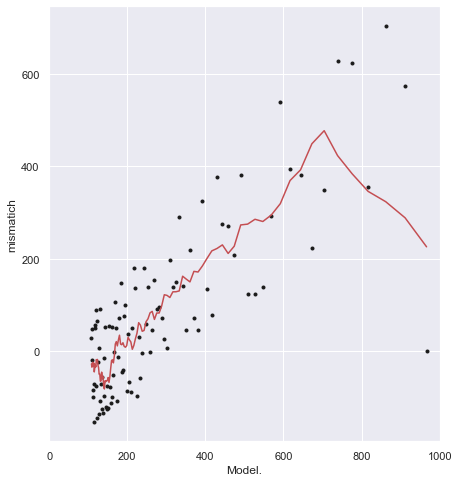

{'mean': [433.5458668914451, 'r'],
 'STD': [147.30939013792786, 'b'],
 'P10': [286.10102492326337, 'y'],
 'P50': [387.96971161462847, 'g'],
 'P90': [626.5668641364435, 'k']}

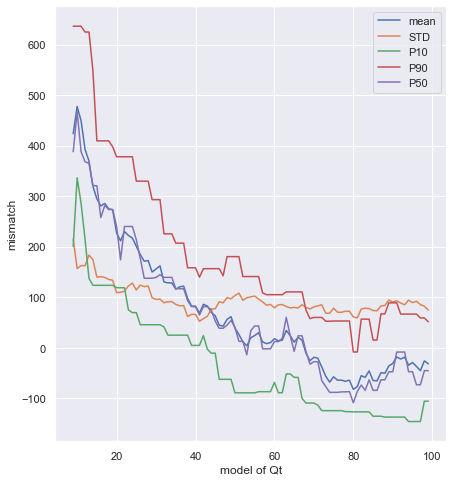

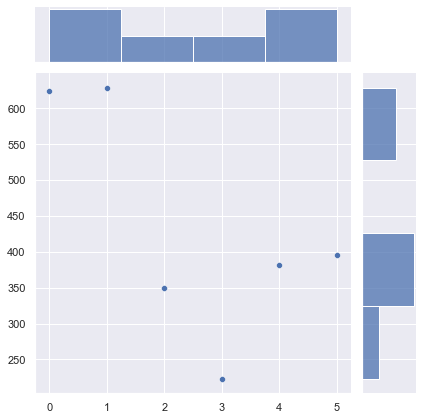

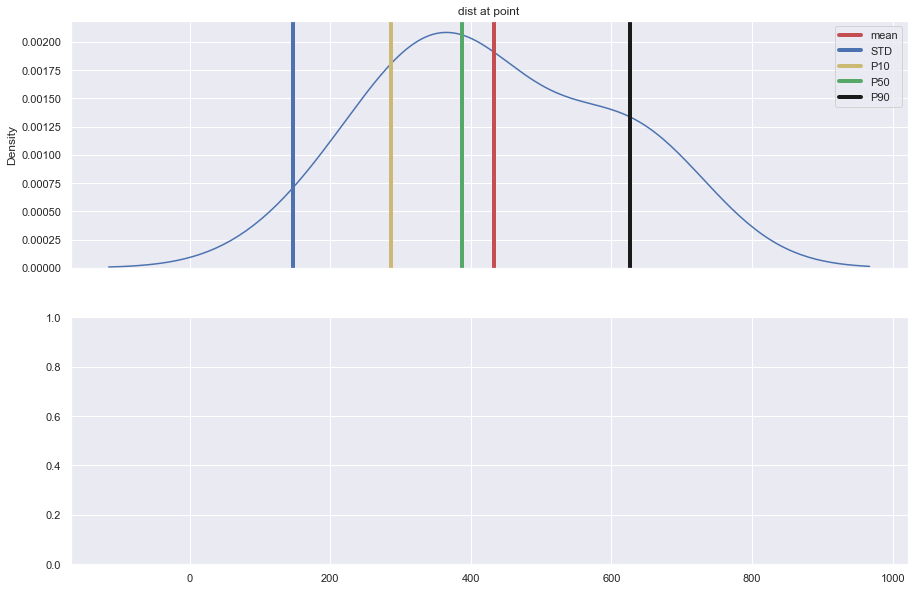

In [16]:
M(pred_q,mismatch,700,100)

In [17]:
# define sample size
n_samples = 100

# sample q0
q0_mean = 1000
q0_sd = 180
q0_samples = lognormal_samples(q0_mean,q0_sd, n_samples)

# # sample Di
Di_min = 0.005
Di_mode = 0.02
Di_max = 0.05
Di_samples = triangular_samples(Di_min, Di_mode, Di_max, n_samples)
# Di_samples = Normal(0.05, 0.03, n_samples)

# # sample b
b_min = 0.4
b_max = 0.7
b_samples = uniform_samples(b_min, b_max, n_samples)

times = np.array([range(50)]).T


In [18]:
qt_ens = ArpsRate(times,q0_samples, Di_samples, b_samples)

In [19]:
Ens_mismatch= np.subtract(qt_ens,np.tile(Q_SEM,(qt_ens.shape[0],1)) )

In [20]:
def p(matY,lst, win_size_fraction=0.05):
    window_size=int(win_size_fraction*matY.size)    #fraction is about fraction of size of window to calculate needed paramter
    fig, ax = plt.subplots()
    ss = pd.Series(matY.flatten())
    ss.rolling(window_size).mean().plot(ax=ax,label='mean')
    ss.rolling(window_size).std().plot(ax=ax,label='STD')
    ss.rolling(window_size).quantile(.1, interpolation='linear').plot(ax=ax,label='P10')
    ss.rolling(window_size).quantile(.9, interpolation='linear').plot(ax=ax,label='P90')
    ss.rolling(window_size).quantile(.5, interpolation='linear').plot(ax=ax,label='P50')
    ax.legend()
    sns.jointplot(data=lst.flatten(),kind='hex')

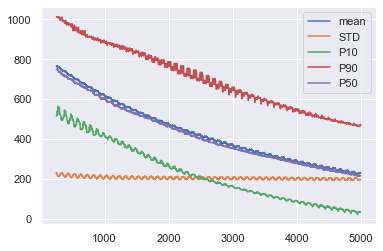

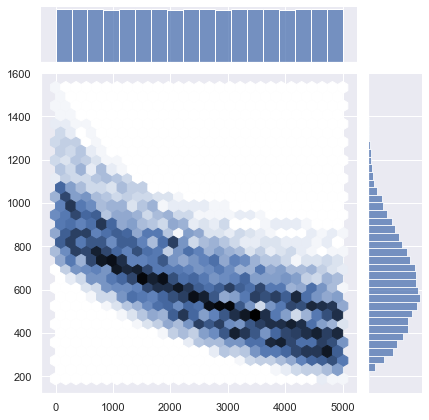

In [21]:
p(Ens_mismatch,qt_ens)

In [22]:
data= M(qt_ens,Ens_mismatch, 100,100)
df= pd.DataFrame.from_dict(data)

Not in range


In [23]:
# df['mean'].plot()
# df['P10'].plot()
# df['P90'].plot()

In [24]:
def M_A(matX,matY,radious,step=2):
    mn_range=np.min(matX); mx_range=np.max(matX)
    flt_X=matX.flatten()
    flt_Y=matY.flatten()    
    save_mat=[]
    for p in flt_X:
        lst=[]
        for j in range(len(flt_X)):
            if (flt_X[j]>= (p-radious))& (flt_X[j]<=p+radious):
                lst.append(flt_Y[j])
        mu=np.mean(lst)
        sd=np.std(lst)
        PC=np.percentile(lst,[10,50,90])
#         PC=[1,2,3]
#                     dic={'it num':p,'mean':[mu,'r'], 'STD': [sd,'b'], 'P10':[PC[0],'y'], 'P50':[PC[1],'g'], 'P90':[PC[2],'k']}
        dic={'x':p,'mean':mu, 'STD': sd, 'P10':PC[0], 'P50':PC[1], 'P90':PC[2]}
        save_mat.append(dic)    
    if len(lst)==0:
        print( "Not in range")
        return 
    df= pd.DataFrame.from_dict(save_mat)
    df.sort_values(by=['x'],ascending=False, inplace=True)
    fig = go.Figure([
    go.Scatter(
        name='ave',
        x=df['x'],
        y=df['mean'],
        line=dict(color='rgb(0,100,80)'),
        mode='lines'
    ),
    go.Scatter(
        name='P10',
        x=df['x'], # x, then x reversed
        y=df['P10'], # upper, then lower reversed
        line=dict(color='rgba(255,255,255)'),
        
    ),
        go.Scatter(
        name='P90',   
        x=df['x'], # x, then x reversed
        y=df['P90'], # upper, then lower reversed
        line=dict(color='rgba(255,0,255)'),
        
    ),
      go.Scatter(
        name='P50' ,   
        x=df['x'], # x, then x reversed
        y=df['P50'], # upper, then lower reversed
        line=dict(color='rgba(255,255,0)'),
        
    )  
    ])
    
    fig.show()    
    return df

In [25]:
ans=M_A(qt_ens,Ens_mismatch, 100,100)

In [26]:
N = 100 # No.Realization
n=50 #times
Q_SEM = np.zeros((n,N))
for i in range(N):
    Tau_sample = uniform_samples(50,70,1)
    n_sample = uniform_samples(0.0001,1,1)
    T = np.arange(0,n)
    Q1=np.linspace(0,1000,n)[::-1]     #Also can chane it in a way to make different Qini Q fin)
#     Q1=lognormal_samples(1000,50, n)
    Q_SEM[:,i]=SEM(T,Q1,Tau_sample,n_sample)

QS_DF=pd.DataFrame(Q_SEM,columns=['realization'+str(i) for i in range(N)])

# QS_DF['Time']=pd.Series(T)   

In [27]:
QS_DF

,realization0,realization1,realization2,realization3,realization4,realization5,realization6,realization7,realization8,realization9,...,realization90,realization91,realization92,realization93,realization94,realization95,realization96,realization97,realization98,realization99
0,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,...,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000
1,957.549791,918.653529,876.954039,950.157240,779.359482,741.674174,654.062346,917.656261,667.215150,505.841133,...,879.444693,387.302061,940.199627,761.693584,926.610687,890.025678,599.344786,930.223713,950.796834,882.176436
2,919.334484,867.049979,816.109552,907.101005,713.673358,679.976550,599.330701,865.878315,610.545255,472.679270,...,820.889845,374.741695,892.838040,697.698383,875.347672,833.395350,552.192783,881.755227,908.508972,821.601260
3,883.142758,823.022637,767.440450,867.031332,665.784988,635.916507,561.471962,821.795785,571.253879,449.458776,...,774.004395,364.195361,850.019885,651.539903,830.648431,787.405816,519.742930,839.374514,869.178630,772.771540
4,848.510448,783.533808,725.489573,829.177362,626.606606,600.170691,531.178826,782.305393,539.813268,430.467842,...,733.499072,354.491497,810.314649,613.949453,790.093318,747.329722,493.725704,800.790909,832.017595,730.507215
5,815.204821,747.278498,688.050316,793.157584,592.813394,569.440833,505.303163,746.077776,512.978483,413.866090,...,697.253614,345.258620,773.047149,581.591985,752.601019,711.248185,471.406411,764.992354,796.639474,692.691501
6,783.079578,713.532500,653.951581,758.734900,562.761048,542.132307,482.367751,712.376775,489.220020,398.816541,...,664.149577,336.329470,737.814212,552.836622,717.553216,678.139766,451.520492,731.405208,762.806125,658.192372
7,752.031089,681.836028,622.476687,725.743171,535.498199,517.338411,461.551595,680.735843,467.684954,384.864766,...,633.505768,327.613898,704.343328,526.747928,684.547380,647.377754,433.372823,699.658773,730.351925,626.312778
8,721.980270,651.871436,593.146006,694.056954,510.417452,494.488439,442.347434,650.833158,447.844863,371.735179,...,604.868107,319.057548,672.435461,502.732913,653.299251,618.541742,416.537684,669.492937,699.152671,596.583778
9,692.863641,623.406100,565.618088,663.576607,487.103708,473.197023,424.418068,622.433362,429.347685,359.247405,...,577.914418,310.625010,641.937315,480.388756,623.596530,591.331784,400.734149,640.714527,669.110311,568.670001


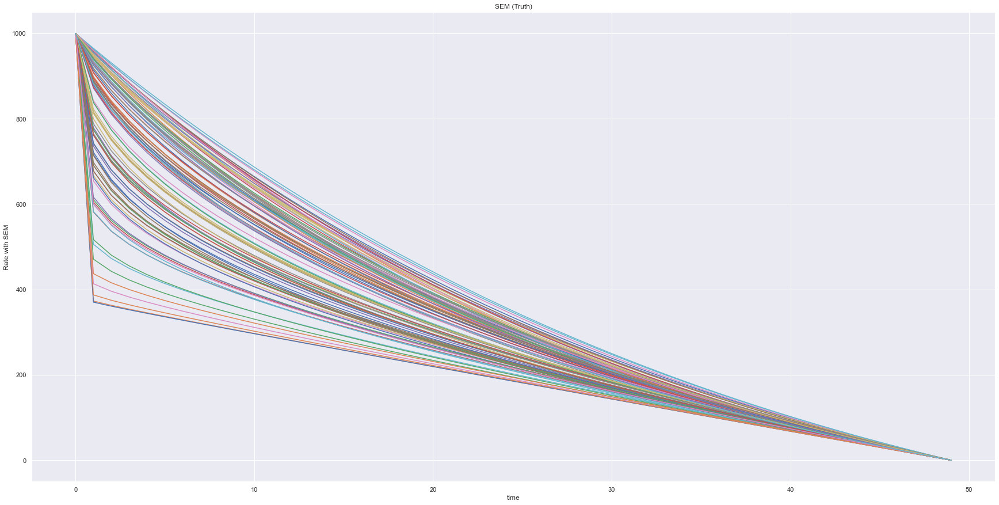

In [28]:
plt.figure(figsize=(30,15))
plt.plot(QS_DF)
plt.title('SEM (Truth)')
plt.xlabel('time')
plt.ylabel('Rate with SEM')
plt.show()

In [29]:
# SEM_T = go.Figure()
# for key, value in QS_DF.iteritems():
#     SEM_T.add_trace(go.Scatter(x=T, y=QS_DF[(key)], mode='lines', name=str(key), line=dict(color='gray')))
# SEM_T.update_layout(title={'text':'SEM Decline(True)','x':0.5,'y':0.85}, xaxis_title='Time (days)', yaxis_title='Oil Rate (bbl/day)')
# #fig_arps.update_layout(legend=dict(x=0.1,y=0.9,traceorder='normal',font=dict(size=15,)))
# SEM_T.show()

   Iteration     Total nfev        Cost      Cost reduction    Step norm     Optimality   
       0              1         1.1038e+06                                    1.32e+04    
       1              2         5.6111e+05      5.43e+05       3.50e+01       2.98e+05    
       2              3         2.8952e+05      2.72e+05       1.23e+01       2.24e+05    
       3              4         2.0506e+05      8.45e+04       1.54e+00       9.99e+04    
       4              5         1.6874e+05      3.63e+04       8.42e+01       5.09e+04    
       5              6         1.6430e+05      4.44e+03       4.38e-01       1.73e+04    
       6              7         1.6332e+05      9.78e+02       1.72e+00       5.37e+03    
       7              8         1.6323e+05      9.06e+01       1.16e-01       1.09e+03    
       8              9         1.6322e+05      4.12e+00       5.15e-03       2.10e+02    
       9             10         1.6322e+05      1.07e-01       1.09e-04       3.84e+01    

C:\Users\siava\anaconda3\lib\site-packages\scipy\optimize\_lsq\least_squares.py:110: UserWarning:

Setting `ftol` below the machine epsilon (2.22e-16) effectively disables the corresponding termination condition.



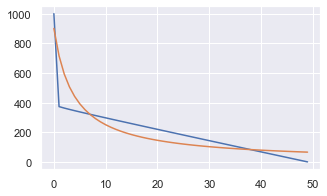

In [30]:
y=QS_DF['realization21']
T_=T
noise_sigma = T_/20
noise = np.ones((n))   #np.random.randn(n) * noise_sigma
params2,cov = curve_fit(ArpsRate,T_,y/1,bounds=([900,.1,0.00001],[1000,50,.99999]),verbose=2,sigma=1/noise**2,ftol =1e-99, absolute_sigma=True)
                            # po:range ,sill ,nugget 
q = params2[0]
D = params2[1]
b = params2[2]

print('for exponential variogram')
print('Q is:',round(q,9))
print('D is:',round(D,4))
print('b:',round(b,8))
print(cov)
plt.figure(figsize=(5,3))
plt.plot(T_,y)
plt.plot(T_,ArpsRate(T,q, D,b))

In [31]:
para_mat=np.zeros((3,N))
Cov_mat=np.zeros((3,N,3))
T_=T#*100
noise_sigma = T_/20

for i,column in enumerate(QS_DF):
    noise = np.random.rand(n) * noise_sigma
    noise[noise<=0]=.01
    params,cov = curve_fit(ArpsRate,T_,QS_DF[column]/1      ,maxfev =100*1000,bounds=([950,.1,0.0001],[1000,3,.99999]),ftol=1.e-16,verbose=0,sigma=1/noise**2,
                           absolute_sigma=True)
    para_mat[:,i]=params
    Cov_mat[:,i,:]=cov
    

C:\Users\siava\anaconda3\lib\site-packages\scipy\optimize\_lsq\least_squares.py:110: UserWarning:

Setting `ftol` below the machine epsilon (2.22e-16) effectively disables the corresponding termination condition.



In [32]:
ARP_Mdl=np.zeros((n,N))
for i in range(N):
    ARP_Mdl[:,i]=ArpsRate(T,para_mat[0,i],para_mat[1,i],para_mat[2,i])

In [33]:

# ARPS_Model = go.Figure()
# for i in range(N):
#     ARPS_Model.add_trace(go.Scatter(x=T, y=ARP_Mdl[:,i], mode='lines', name='Model'+str(i)))
# ARPS_Model.update_layout(title={'text':'Arps Model','x':0.5,'y':0.85}, xaxis_title='Time (days)', yaxis_title='Oil Rate (bbl/day)')
# #fig_arps.update_layout(legend=dict(x=0.1,y=0.9,traceorder='normal',font=dict(size=15,)))
# ARPS_Model.show()

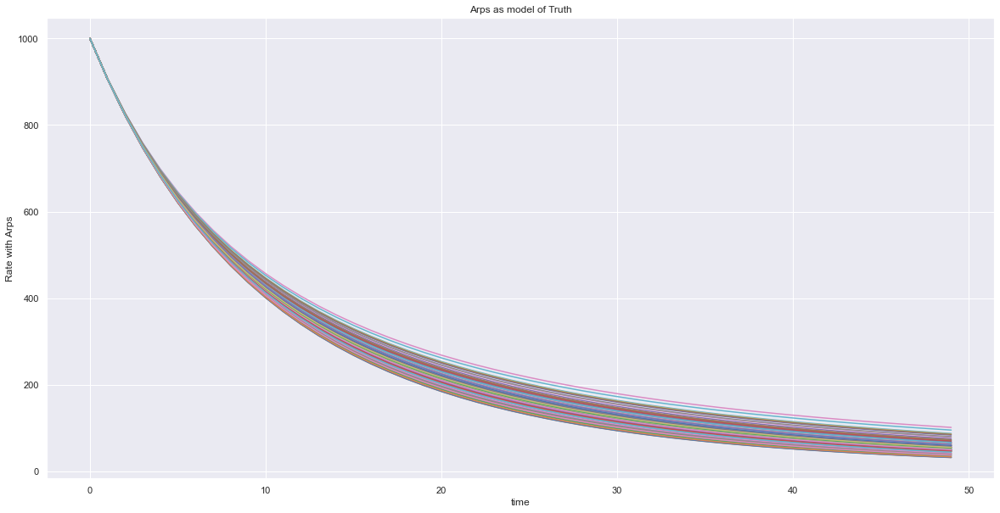

In [34]:
plt.figure(figsize=(20,10))
plt.plot(ARP_Mdl)
plt.title('Arps as model of Truth')
plt.xlabel('time')
plt.ylabel('Rate with Arps')
plt.show()

In [35]:
ARP_DF = pd.DataFrame(ARP_Mdl,columns=['realization'+str(i) for i in range(N)])

In [36]:
Mismatch = QS_DF- ARP_DF 

In [37]:
Mismatch.shape

(50, 100)

In [38]:
Mismatch.head(5)

,realization0,realization1,realization2,realization3,realization4,realization5,realization6,realization7,realization8,realization9,...,realization90,realization91,realization92,realization93,realization94,realization95,realization96,realization97,realization98,realization99
0,3.514060e-10,2.046363e-12,6.410801e-10,4.268827e-09,2.273737e-13,1.136868e-13,1.136868e-13,5.456968e-12,1.136868e-13,1.136868e-13,...,2.825118e-10,1.136868e-13,3.672085e-11,2.670504e-10,5.178435e-10,4.547474e-12,1.136868e-13,5.115908e-12,1.608669e-10,1.136868e-13
1,5.110170e+01,1.210046e+01,-2.964361e+01,4.353679e+01,-1.265734e+02,-1.644835e+02,-2.523704e+02,1.124695e+01,-2.389139e+02,-4.003303e+02,...,-2.690552e+01,-5.184400e+02,3.391289e+01,-1.444135e+02,2.011464e+01,-1.672533e+01,-3.065115e+02,2.329066e+01,4.446594e+01,-2.386281e+01
2,9.489327e+01,4.224460e+01,-8.850224e+00,8.206237e+01,-1.089665e+02,-1.434524e+02,-2.250572e+02,4.157188e+01,-2.127833e+02,-3.507976e+02,...,-3.210953e+00,-4.472253e+02,6.895843e+01,-1.255534e+02,5.073997e+01,7.905842e+00,-2.701776e+02,5.563950e+01,8.447544e+01,-1.412482e+00
3,1.309107e+02,7.007660e+01,1.419217e+01,1.136288e+02,-8.289135e+01,-1.143222e+02,-1.906554e+02,6.982843e+01,-1.787865e+02,-3.008747e+02,...,2.244128e+01,-3.831424e+02,9.889215e+01,-9.834877e+01,7.808978e+01,3.312272e+01,-2.283979e+02,8.387244e+01,1.177479e+02,2.335396e+01
4,1.601270e+02,9.403930e+01,3.552539e+01,1.389736e+02,-5.621154e+01,-8.509956e+01,-1.570416e+02,9.433436e+01,-1.451463e+02,-2.549508e+02,...,4.615848e+01,-3.262174e+02,1.236538e+02,-7.077232e+01,1.012014e+02,5.576034e+01,-1.882495e+02,1.073363e+02,1.448836e+02,4.652440e+01


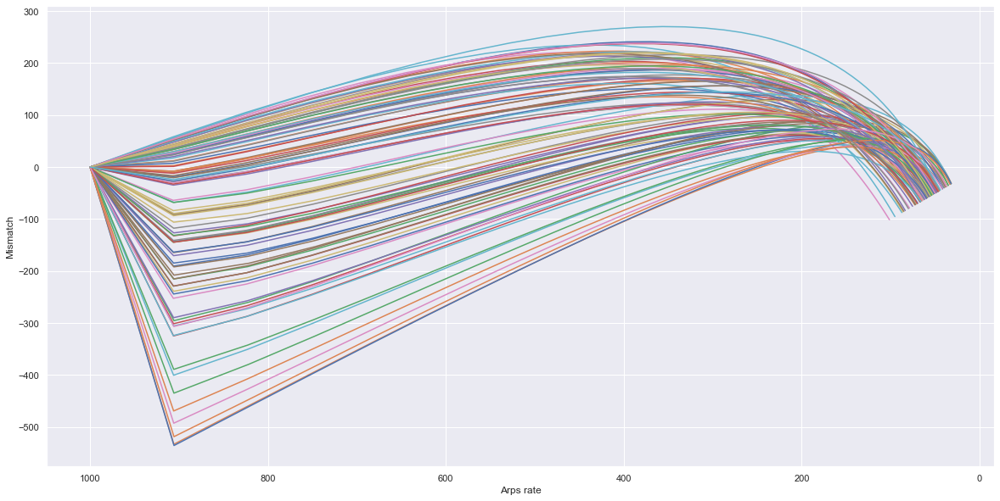

In [39]:
plt.figure(figsize=(20,10))
plt.plot(ARP_DF,Mismatch)
plt.xlabel('Arps rate')
plt.ylabel('Mismatch')
plt.gca().invert_xaxis()
plt.show()

In [40]:
def M_A(matX,matY,win_size):
    mn_range=np.min(matX); mx_range=np.max(matX)
    flt_X=matX.flatten()
    flt_Y=matY.flatten()
    save_mat=[]
    for p in flt_X:
        lstX=[]
        lstY=[]
        for j in range(len(flt_X)):
            if (flt_X[j]>= (p/2-win_size))& (flt_X[j]<=p/2+win_size):
                lstY.append(flt_Y[j])
                lstX.append(flt_X[j])
        if len(lstY)==0:
            print( "Not in range")
            return
        cov_M=np.cov(lstX,lstY)
        mu=np.mean(lstY)
        sd=np.std(lstY)
        PC=np.percentile(lstY,[10,50,90])
#                     dic={'it num':p,'mean':[mu,'r'], 'STD': [sd,'b'], 'P10':[PC[0],'y'], 'P50':[PC[1],'g'], 'P90':[PC[2],'k']}
        dic={'x':p,'mean':mu, 'STD': sd, 'P10':PC[0], 'P50':PC[1], 'P90':PC[2],'cov':cov_M[0,1]}
        save_mat.append(dic)    
    df= pd.DataFrame.from_dict(save_mat)
    df.sort_values(by=['x'],ascending=False, inplace=True)
    fig1 = go.Figure([
    go.Scatter(
        name='ave',
        x=df['x'],
        y=df['mean'],
        line=dict(color='rgb(0,100,80)'),
        mode='lines'
    ),
    go.Scatter(
        name='P10',
        x=df['x'], 
        y=df['P10'], 
        line=dict(color='rgba(255,255,255)'),
        
    ),
        go.Scatter(
        name='P90',   
        x=df['x'], 
        y=df['P90'], 
        line=dict(color='rgba(255,0,255)'),
        
    ),
      go.Scatter(
        name='P50' ,   
        x=df['x'], 
        y=df['P50'], 
        line=dict(color='rgba(255,255,0)'),
        
    ),
    
        go.Scatter(
        name='STD' ,   
        x=df['x'], 
        y=df['STD'],
        line=dict(color='rgba(255,255,0)'),
        
    )])
    fig1.update_layout(
    xaxis=dict(visible=True,autorange='reversed'),    
    title="",
    xaxis_title="Arps rate(model)",
    yaxis_title="Mismatch",
    legend_title="window size{}".format(win_size),
    font=dict(
        family="Courier New, monospace",
        size=12
    ))
    fig1.show() 
    fig2 = go.Figure([
    go.Scatter(
        name='Cov',
        x=df['x'],
        y=df['cov'],
        line=dict(color='rgb(0,100,80)'),
        mode='lines'
    )])
    
    fig2.update_layout(
    xaxis=dict(visible=True,autorange='reversed'),    
    title="",
    xaxis_title="Arps rate(model)",
    yaxis_title="Cov of Mismatch",
    legend_title="window size{}".format(win_size),
    font=dict(
        family="Courier New, monospace",
        size=12
    )),

    fig2.show()
    return df

In [41]:
df_out=M_A(np.array(ARP_DF),np.array(Mismatch),win_size=20)  

In [42]:
df_out

,x,mean,STD,P10,P50,P90,cov
41,1000.000000,82.170245,114.466650,-78.090745,111.880627,211.292911,92.248119
34,1000.000000,82.170245,114.466650,-78.090745,111.880627,211.292911,92.248119
29,1000.000000,82.170245,114.466650,-78.090745,111.880627,211.292911,92.248119
77,1000.000000,82.170245,114.466650,-78.090745,111.880627,211.292911,92.248119
91,1000.000000,82.170245,114.466650,-78.090745,111.880627,211.292911,92.248119
...,...,...,...,...,...,...,...
4991,33.256941,-27.800472,5.459090,-34.211462,-27.023194,-20.049056,4.681141
4912,32.891770,-27.800472,5.459090,-34.211462,-27.023194,-20.049056,4.681141
4929,32.343667,-28.296039,5.278167,-34.402366,-27.443230,-20.062083,3.740459
4960,32.108375,-28.296039,5.278167,-34.402366,-27.443230,-20.062083,3.740459


In [43]:
print('totlal',len(df_out))
print('more than 800is',len(df_out[df_out['x']>800]))
print('less than 300is',len(df_out[df_out['x']<300]))

totlal 5000
more than 800is 300
less than 300is 3463


In [44]:
# lst_size=np.arange(100,990,100)
# for i in lst_size:
#     M_A(np.array(ARP_DF),np.array(Mismatch),win_size=i)  

In [45]:
def M_A1(matX,matY,win_size):
    mn_range=np.min(matX); mx_range=np.max(matX)
    flt_X=matX.flatten()
    flt_Y=matY.flatten()
    
    save_mat=[]
    for p in flt_X:
        lstX=[]
        lstY=[]
        
        for j in range(len(flt_X)):
            if (flt_X[j]>= (p/2-win_size))& (flt_X[j]<=p/2+win_size):
                lstY.append(flt_Y[j])
                lstX.append(flt_X[j])
        if len(lstY)==0:
            print( "Not in range")
            return
        cov_M=np.cov(lstX,lstY)
        
        mu=np.mean(lstY)
        sd=np.std(lstY)
        PC=np.percentile(lstY,[10,50,90])
#                     dic={'it num':p,'mean':[mu,'r'], 'STD': [sd,'b'], 'P10':[PC[0],'y'], 'P50':[PC[1],'g'], 'P90':[PC[2],'k']}
        dic={'x':p,'mean':mu, 'STD': sd, 'P10':PC[0], 'P50':PC[1], 'P90':PC[2],'cov':cov_M[0,1]}
        save_mat.append(dic)
    df= pd.DataFrame.from_dict(save_mat)
    df.sort_values(by=['x'],ascending=False, inplace=True)    
    return df

In [46]:
def MA_CV(matX,matY,win_size,K=.5):
    mn_range=np.min(matX); mx_range=np.max(matX)
    matX=matX.flatten()
    matY=matY.flatten()    
    flt_X, X_test, flt_Y, y_test = train_test_split(matX, matY, test_size=K, random_state=77)
    trn=M_A1(flt_X,flt_Y,win_size)
    tst=M_A1(X_test,y_test,win_size)
    score=1-(trn.div(tst))
    return score,trn,tst

In [47]:
_,tr,ts=MA_CV(np.array(ARP_DF),np.array(Mismatch),win_size=100,K=.2)  

In [48]:
tr

,x,mean,STD,P10,P50,P90,cov
372,1000.000000,83.681749,113.367478,-78.062144,108.849906,212.010151,-841.647636
1473,1000.000000,83.681749,113.367478,-78.062144,108.849906,212.010151,-841.647636
1372,1000.000000,83.681749,113.367478,-78.062144,108.849906,212.010151,-841.647636
1154,1000.000000,83.681749,113.367478,-78.062144,108.849906,212.010151,-841.647636
2800,1000.000000,83.681749,113.367478,-78.062144,108.849906,212.010151,-841.647636
...,...,...,...,...,...,...,...
370,33.256941,1.338305,38.785460,-47.993973,-0.003330,52.258694,443.841644
3138,32.891770,1.288023,38.771944,-48.043858,-0.064735,52.178898,442.522247
2493,32.343667,1.122936,38.675472,-48.072221,-0.148564,51.875852,437.403869
3855,32.108375,1.130289,38.687921,-48.073361,-0.125215,51.888840,437.989547


In [49]:
ts.reset_index(drop=False,inplace=True)
ts

,index,x,mean,STD,P10,P50,P90,cov
0,44,1000.000000,61.198508,114.903054,-95.201647,72.243044,201.071840,-944.985159
1,654,1000.000000,61.198508,114.903054,-95.201647,72.243044,201.071840,-944.985159
2,629,1000.000000,61.198508,114.903054,-95.201647,72.243044,201.071840,-944.985159
3,456,1000.000000,61.198508,114.903054,-95.201647,72.243044,201.071840,-944.985159
4,151,1000.000000,61.198508,114.903054,-95.201647,72.243044,201.071840,-944.985159
...,...,...,...,...,...,...,...,...
995,772,38.751447,2.617833,41.061280,-48.649842,0.807832,58.776139,512.523496
996,386,38.250846,2.044980,40.485009,-48.650599,0.634415,58.451689,493.025533
997,536,37.331615,2.044980,40.485009,-48.650599,0.634415,58.451689,493.025533
998,367,36.806406,1.958018,40.572824,-48.651356,0.241815,58.480584,492.546730


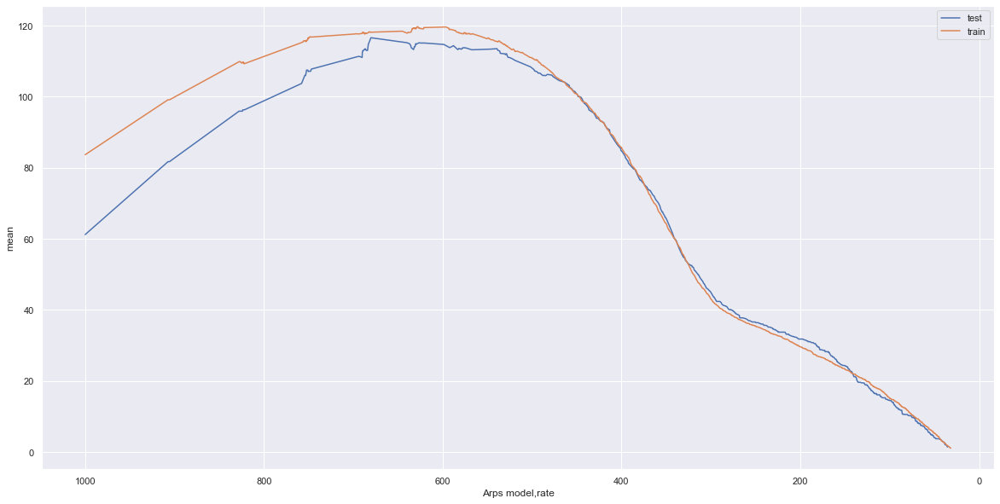

In [50]:
plt.figure(figsize=(20,10))
plt.plot(ts['x'],ts['mean'],label='test')
plt.plot(tr['x'],tr['mean'],label='train')
plt.legend()
plt.xlabel('Arps model,rate')
plt.ylabel('mean')
plt.gca().invert_xaxis()
plt.show()

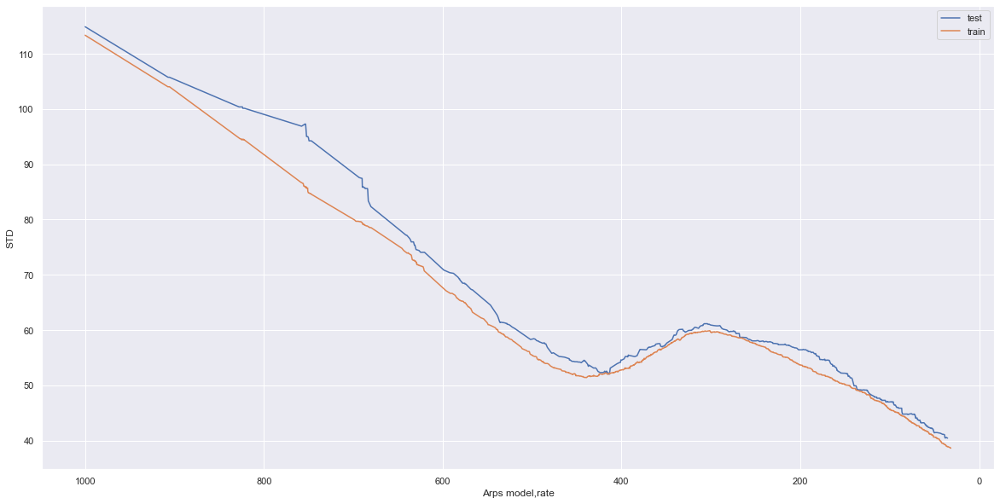

In [51]:

plt.figure(figsize=(20,10))
plt.plot(ts['x'],ts['STD'],label='test')
plt.plot(tr['x'],tr['STD'],label='train')
plt.legend()
plt.xlabel('Arps model,rate')
plt.ylabel('STD')
plt.gca().invert_xaxis()
plt.show()

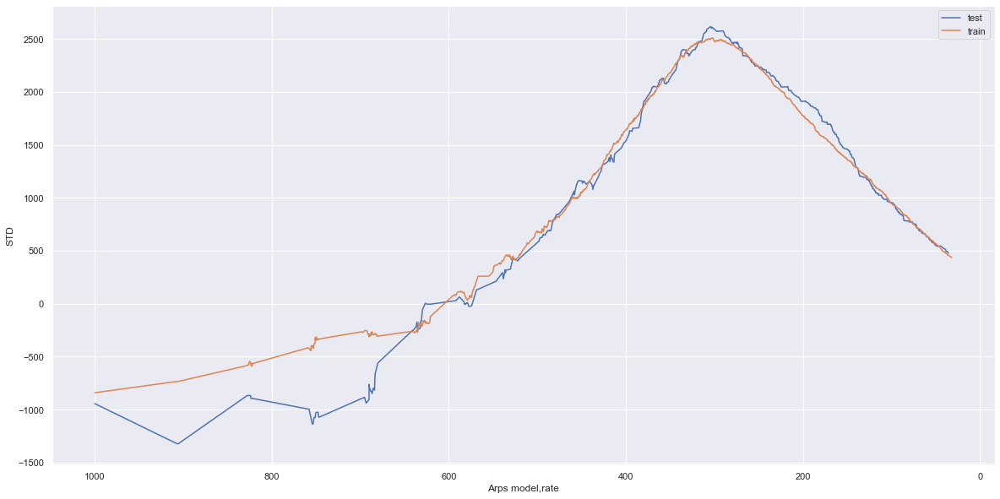

In [52]:
plt.figure(figsize=(20,10))
plt.plot(ts['x'],ts['cov'],label='test')
plt.plot(tr['x'],tr['cov'],label='train')
plt.legend()
plt.xlabel('Arps model,rate')
plt.ylabel('STD')
plt.gca().invert_xaxis()
plt.show()


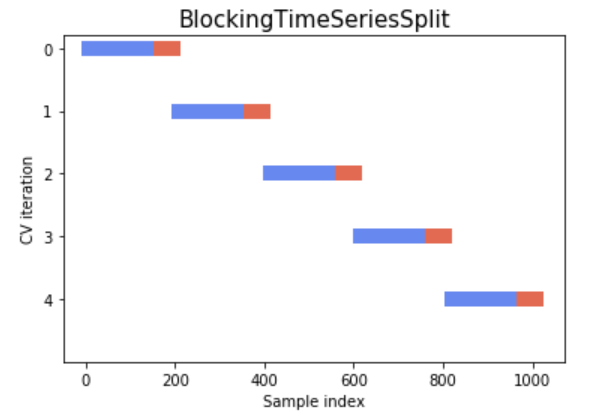

In [53]:
sft=df_out-df_out.shift(1)

In [54]:
df_out['x']

41      1000.000000
34      1000.000000
29      1000.000000
77      1000.000000
91      1000.000000
           ...     
4991      33.256941
4912      32.891770
4929      32.343667
4960      32.108375
4915      31.733358
Name: x, Length: 5000, dtype: float64

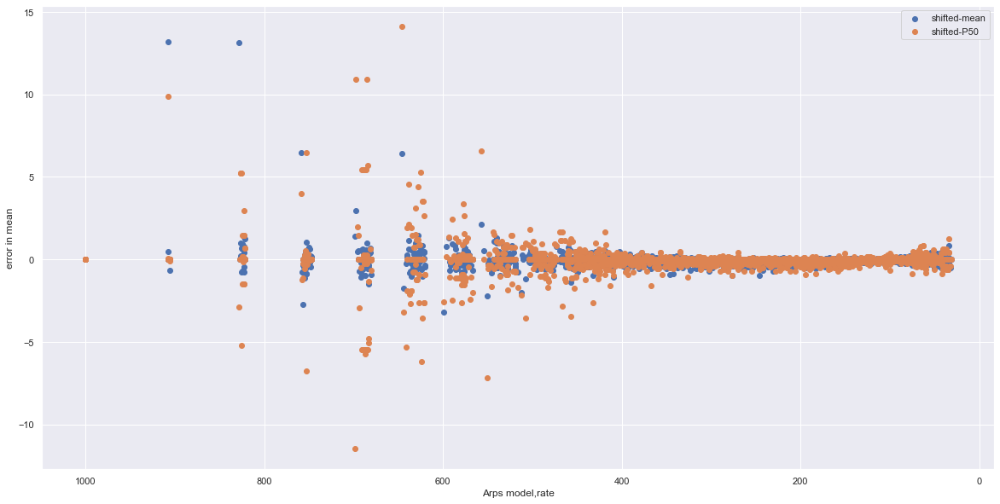

In [55]:
plt.figure(figsize=(20,10))
plt.scatter(df_out['x'],sft['mean'],label='shifted-mean')
plt.scatter(df_out['x'],sft['P50'],label='shifted-P50')
plt.xlabel('Arps model,rate')
plt.ylabel('error in mean')
plt.legend()
plt.gca().invert_xaxis()
plt.show()


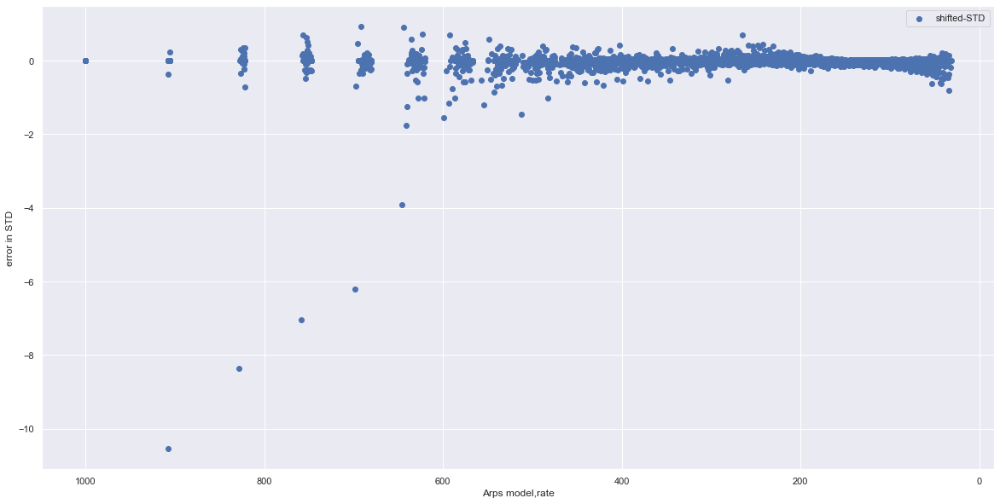

In [56]:
plt.figure(figsize=(20,10))
plt.scatter(df_out['x'],sft['STD'],label='shifted-STD')
plt.xlabel('Arps model,rate')
plt.ylabel('error in STD')
plt.legend()
plt.gca().invert_xaxis()
plt.show()

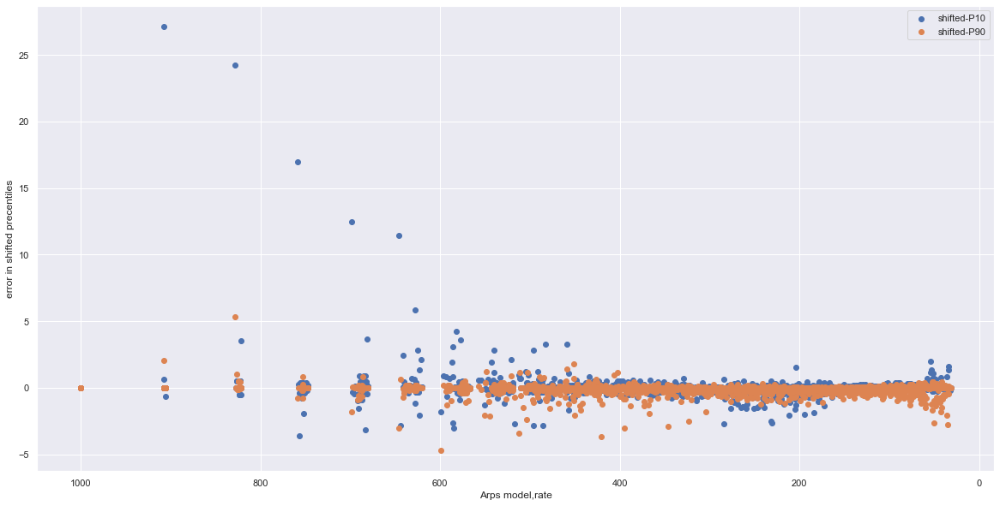

In [57]:
plt.figure(figsize=(20,10))
plt.scatter(df_out['x'],sft['P10'],label='shifted-P10')
plt.scatter(df_out['x'],sft['P90'],label='shifted-P90')
plt.xlabel('Arps model,rate')
plt.ylabel('error in shifted precentiles')
plt.legend()
plt.gca().invert_xaxis()
plt.show()

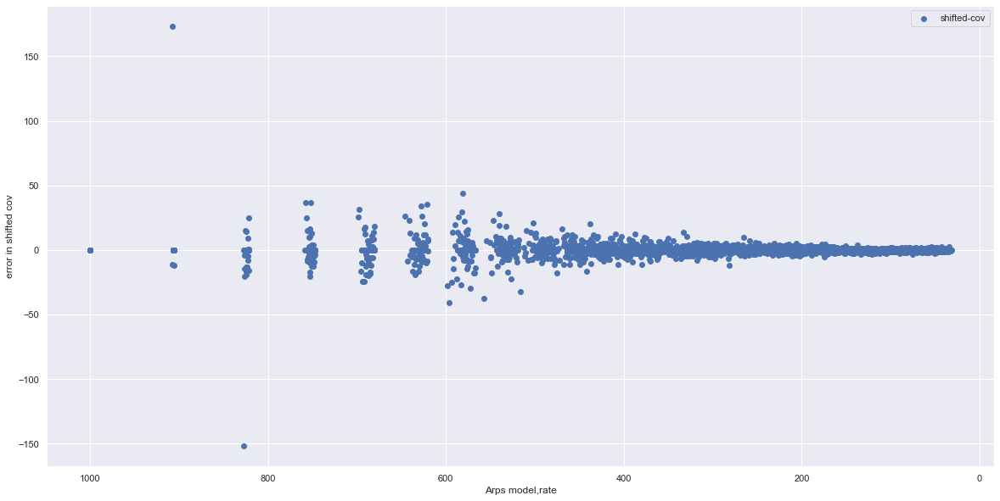

In [58]:
plt.figure(figsize=(20,10))
plt.scatter(df_out['x'],sft['cov'],label='shifted-cov')
plt.xlabel('Arps model,rate')
plt.ylabel('error in shifted cov')
plt.legend()
plt.gca().invert_xaxis()
plt.show()